#Predicting dog breed  (Classification)

##Problem:
Find the breed of the dog by showing the model an image of it.

##Data:
From kaggle : https://www.kaggle.com/c/dog-breed-identification/data


In [ ]:

!wget https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip # download files from Dropbox as zip

import os
import zipfile

local_zip = 'dog-breed-identification.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')

zip_ref.extractall('Dog Vision') # unzip the files into a file called "Dog Vision"
zip_ref.close()

--2024-06-26 14:13:07--  https://www.dropbox.com/s/9kjr0ui9qbodfao/dog-breed-identification.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.5.18, 2620:100:601f:18::a27d:912
Connecting to www.dropbox.com (www.dropbox.com)|162.125.5.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/pjrulzwpa2osmtcl34j5c/dog-breed-identification.zip?rlkey=illavzwa19vysrolwpgqov86a [following]
--2024-06-26 14:13:07--  https://www.dropbox.com/scl/fi/pjrulzwpa2osmtcl34j5c/dog-breed-identification.zip?rlkey=illavzwa19vysrolwpgqov86a
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc3d19ed4bd0e86ee8744f3dac6b.dl.dropboxusercontent.com/cd/0/inline/CVnSf7DI8MoeyyZPvV9qquzzCYQHbZn-NKZIT8VVwGx_ya2t2cCuX0T2I-0QNCMVCgWHIyKuIN1G914DHComIj1UqvFIjHLOcZWIANvShci_QTLrQPRzOKuzKtB7acS3GJh2RXVCyCjTKkFtDukMLMxN/file# [following]
--2024-06-26 14:13:07--  https://uc3d19ed4bd0e86ee874

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)



TF version: 2.15.0
Hub version: 0.16.1


In [ ]:
#Check for gpu
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  print("GPU found")
else:
  print("No GPU found")

GPU found


In [ ]:
labels = pd.read_csv('Dog Vision/labels.csv')
labels.head()


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


In [ ]:
labels.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
labels.breed.value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

In [ ]:
labels["breed"].value_counts().median()

82.0

<Axes: xlabel='breed'>

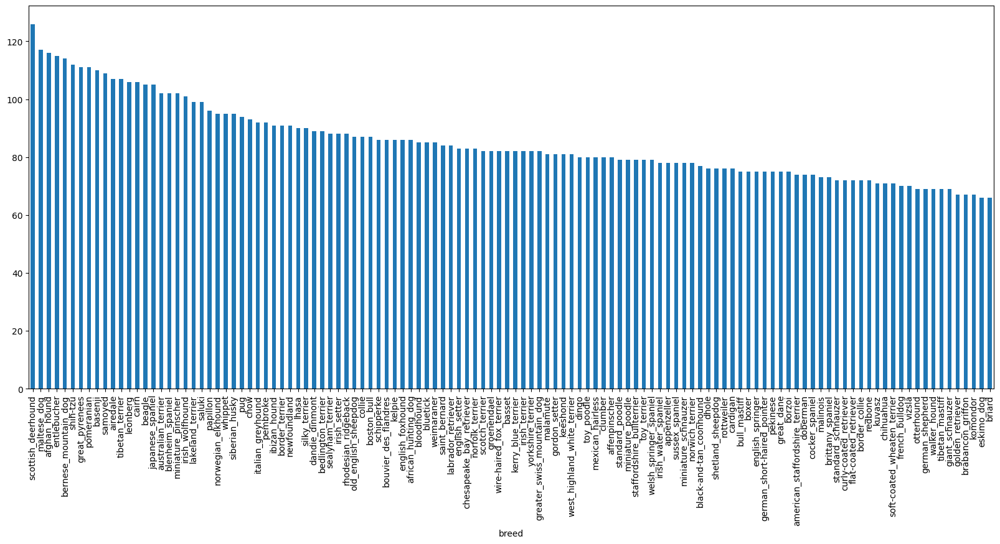

In [ ]:

labels.breed.value_counts().plot.bar(figsize=(20, 8))


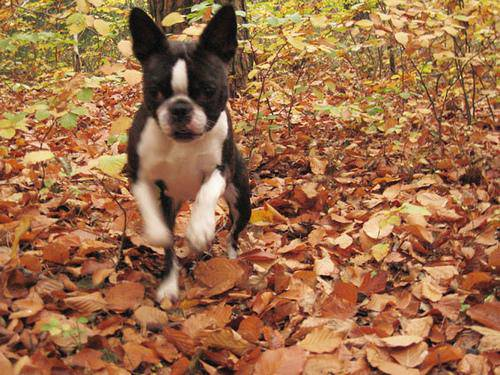

In [ ]:
from IPython.display import Image
Image('Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

###Getting images and their labels

In [ ]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#create pathnames from image ids
filnames = ["Dog Vision/train/"+fname +".jpg" for fname in labels['id']]
filnames

['Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'Dog Vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'Dog Vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'Dog Vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'Dog Vision/train/006cc3ddb9dc1bd827479569fcdc52dc.jpg',
 'Dog Vision/train/0075dc49dab4024d12fafe67074d8a81.jpg',
 'Dog Vision/train/00792e341f3c6eb33663e415d0715370.jpg',
 'Dog Vision/train/007b5a16db9d9ff9d7ad39982703e429.jpg',
 'Dog Vision/t

In [ ]:
len(filnames)

10222

In [ ]:
len(labels)

10222

In [ ]:
import os
if len(os.listdir("Dog Vision/train/")) == len(filnames):
  print("Files match")
else:
  print("Files do not match")

Files match


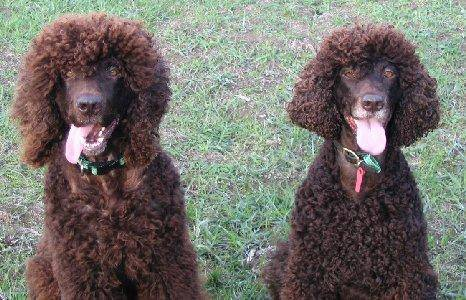

In [ ]:
Image(filnames[8600])

In [ ]:
labels.iloc[8600]

id       d7db04ffefefce6e6a1ddedbd350a38f
breed                 irish_water_spaniel
Name: 8600, dtype: object

now we have our training images file path in a list so lets prepare our labels

In [ ]:
labels2 = labels['breed'].to_numpy()
labels2

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels2)

10222

In [ ]:
if len(labels2) == len(filnames):
  print("Files match")
else:
  print("Files do not match")

Files match


In [ ]:
# Count the number of unique elements in the NumPy array
num_unique_elements = np.unique(labels2)

print(len(num_unique_elements))

120


In [ ]:
print(labels2[0])
labels2[0] == num_unique_elements

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
num_unique_elements

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
#turn every label into boolean array
boolean_labels = [label == num_unique_elements for label in labels2]
len(boolean_labels)

10222

In [ ]:
len(labels2)

10222

In [ ]:
# turning a boolean array into integers
print(labels2[0])
print(np.where(num_unique_elements == labels2[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index in the boolean array
print(boolean_labels[0].astype(int)) # where its true there will be a 1

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels2[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filnames[:10]

['Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:

#creating our own validation set
#we are going to start off with experimenting on 1000 images and increase it as needed
NUM_IMAGES = 1000 #@param {type : "slider", min:1000, max:10000}



In [ ]:
from sklearn.model_selection import train_test_split
train_filenames, val_filenames, train_labels, val_labels = train_test_split(filnames[:NUM_IMAGES], boolean_labels[:NUM_IMAGES], test_size=0.2, random_state=42)

In [ ]:

print("Train filenames length:", len(train_filenames))
print("Validation filenames length:", len(val_filenames))
print("Train labels length:", len(train_labels))
print("Validation labels length:", len(val_labels))


Train filenames length: 800
Validation filenames length: 200
Train labels length: 800
Validation labels length: 200


In [ ]:
train_labels[:10]



[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
train_filenames[:10]

['Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'Dog Vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'Dog Vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'Dog Vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'Dog Vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'Dog Vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [ ]:
X = filnames
y = boolean_labels

Preprocess images(turning images into tensors)

In [ ]:
#convert an image to numpy array

from matplotlib.image import imread
image = imread(filnames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
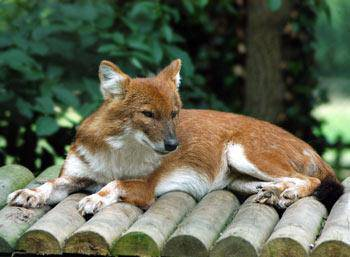

In [ ]:
image

In [ ]:
image.min(), image.max()

(0, 255)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

the only difference is that it is now in a tensor so it will beable to run on a gpu

In [ ]:
tensor = tf.io.read_file(filnames[42])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\x01\x01^\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor = tf.image.decode_jpeg(tensor, channels=3)
tensor

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 88, 138,  87],
        [ 75, 125,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  84],
        [ 76, 134,  86],
        [ 75, 133,  85]],

       [[ 71, 120,  73],
        [ 65, 115,  66],
        [ 62, 112,  63],
        ...,
        [ 73, 131,  83],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 54, 105,  64],
        [ 56, 107,  66],
        [ 62, 113,  72],
        ...,
        [ 70, 127,  82],
        [ 71, 128,  83],
        [ 72, 129,  84]],

       ...,

       [[  2,  11,  10],
        [  4,  13,  10],
        [  6,  15,  12],
        ...,
        [119, 112,  66],
        [125, 119,  71],
        [121, 115,  67]],

       [[  0,   3,   7],
        [  0,   7,   9],
        [  2,   8,   4],
        ...,
        [104,  97,  51],
        [111, 104,  58],
        [109, 102,  56]],

       [[ 16,  18,  30],
        [ 14,  19,  23],
        [ 15,  20,  13],
        ...,
        [ 99,  92,  4

In [ ]:
tensor = tf.image.convert_image_dtype(tensor, tf.float32)
tensor

<tf.Tensor: shape=(257, 350, 3), dtype=float32, numpy=
array([[[0.34509805, 0.5411765 , 0.34117648],
        [0.29411766, 0.4901961 , 0.2901961 ],
        [0.24705884, 0.43529415, 0.23137257],
        ...,
        [0.29803923, 0.5254902 , 0.32941177],
        [0.29803923, 0.5254902 , 0.3372549 ],
        [0.29411766, 0.52156866, 0.33333334]],

       [[0.2784314 , 0.47058827, 0.28627452],
        [0.25490198, 0.45098042, 0.25882354],
        [0.24313727, 0.43921572, 0.24705884],
        ...,
        [0.28627452, 0.5137255 , 0.3254902 ],
        [0.2901961 , 0.5176471 , 0.32941177],
        [0.2901961 , 0.5176471 , 0.32941177]],

       [[0.21176472, 0.41176474, 0.2509804 ],
        [0.21960786, 0.41960788, 0.25882354],
        [0.24313727, 0.4431373 , 0.28235295],
        ...,
        [0.27450982, 0.49803925, 0.32156864],
        [0.2784314 , 0.5019608 , 0.3254902 ],
        [0.28235295, 0.5058824 , 0.32941177]],

       ...,

       [[0.00784314, 0.04313726, 0.03921569],
        [0.01

In [ ]:
#define image size
IMAGE_SIZE = 224
# define a function for preprocessing images
def process_image(image_path, img_size= IMAGE_SIZE):
  """
  Takes an image file path (string) and turns it into a Tensor.
  """
  # Read in the image
  image = tf.io.read_file(image_path)
  # Decode it into a tensor in (RGB)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the colour channel values from 0-255 to 0-1 values so it scales them
  # the values become between 0 and 1 which is called normalization
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image (to the desired size)
  image = tf.image.resize(image, size=[IMAGE_SIZE, IMAGE_SIZE])
  # Rescale the image (get all values between 0 and 1)
  #image = image/255.
  return image

###Turning our data to batches

In [ ]:
#turning our data into batches
 #we do 32 at a time because all of them might not fit into memory
#we need tuples each in the form  (image,label)

def get_image_label(image_path, label):
  """
  Takes an image file path (string) and label and turns it into a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
(process_image(X[42],tf.constant(y[42])))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [ ]:
BATCH_SIZE = 32
# create a function to turn data to batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs. Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid data set , we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filespaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster
    data = data.shuffle(buffer_size=len(X))
    #create tupples
    data = data.map(get_image_label)
    # Create batches of data
    data_batch = data.batch(BATCH_SIZE)
    return data_batch


In [ ]:
#create training and validation data batches
train_data = create_data_batches(train_filenames, train_labels)
valid_data = create_data_batches(val_filenames, val_labels, valid_data=True)



Creating training data batches...
Creating validation data batches...


In [ ]:
#check out different attributes of our data batches
train_data.element_spec, valid_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### visualizing data batches

In [ ]:
# visualizing data batches
def show_25_images(images, labels):
  """
  Displays a random sample of 25 images from an
  image batch and their corresponding labels.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplot (5 rows,5 columns)
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(num_unique_elements[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")




In [ ]:
num_unique_elements[y[0].argmax()]

'boston_bull'

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels


(array([[[[0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          ...,
          [0.92186904, 0.776771  , 0.66304547],
          [0.82979524, 0.68469715, 0.57097167],
          [0.7657662 , 0.6206681 , 0.50694263]],
 
         [[0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          ...,
          [0.9309309 , 0.793676  , 0.6760289 ],
          [0.821537  , 0.68428206, 0.566635  ],
          [0.6979499 , 0.560695  , 0.44304788]],
 
         [[0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          [0.9176471 , 0.9176471 , 0.9176471 ],
          ...,
          [0.8509632 , 0.7176298 , 0.6078259 ],
          [0.76812226, 0.63478893, 0.524985  ],
          [0.7379355 , 0.60460216, 0.49479824]],
 
         ...,
 
         [[0.87947685, 0.703824  , 0.5900985 ],
          [0.87732

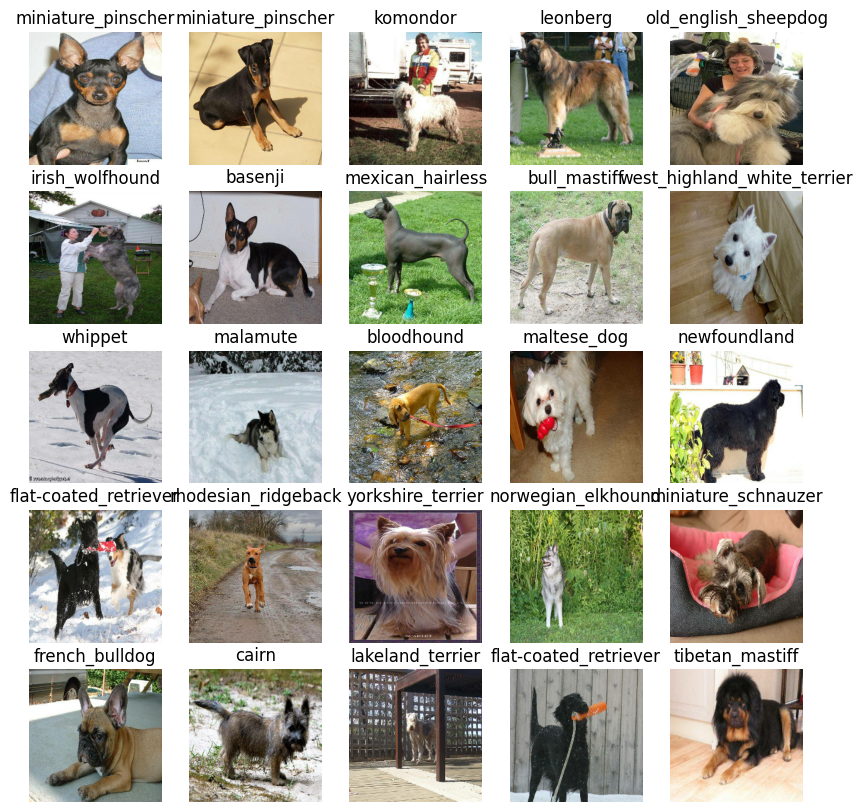

In [ ]:
show_25_images(train_images, train_labels)

In [ ]:
# prompt: show_25_images(train_images, train_labels) this funciton returned black images so fix it : # visualizing data batches
# def show_25_images(images

def show_25_images(images, labels):
  """
  Displays a random sample of 25 images from an
  image batch and their corresponding labels.
  """
  # Setup the figure
  plt.figure(figsize=(10, 7))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # create subplot (5 rows,5 columns)
    ax = plt.subplot(5, 5, i + 1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(num_unique_elements[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")
    plt.subplots_adjust(hspace=0.5)



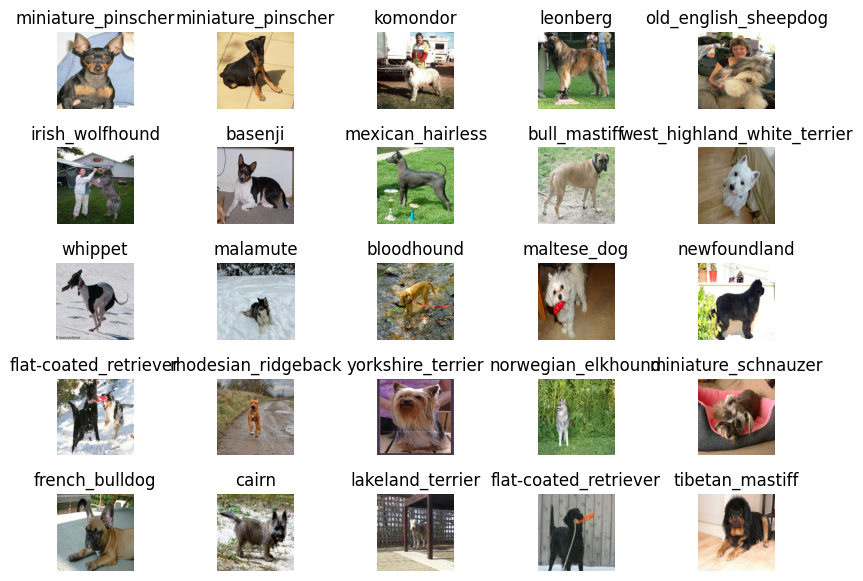

In [ ]:
show_25_images(train_images, train_labels)

In [ ]:
val_images, val_labels = next(valid_data.as_numpy_iterator())
val_images, val_labels


(array([[[[0.29599646, 0.43284872, 0.3056691 ],
          [0.26635826, 0.32996926, 0.22846507],
          [0.31428418, 0.27701408, 0.22934894],
          ...,
          [0.77614343, 0.82320225, 0.8101595 ],
          [0.81291157, 0.8285351 , 0.8406944 ],
          [0.8209297 , 0.8263737 , 0.8423668 ]],
 
         [[0.2344871 , 0.31603682, 0.19543913],
          [0.3414841 , 0.36560842, 0.27241898],
          [0.45016077, 0.40117094, 0.33964607],
          ...,
          [0.7663987 , 0.8134138 , 0.81350833],
          [0.7304248 , 0.75012016, 0.76590735],
          [0.74518913, 0.76002574, 0.7830809 ]],
 
         [[0.30157745, 0.3082587 , 0.21018331],
          [0.2905954 , 0.27066195, 0.18401104],
          [0.4138316 , 0.36170745, 0.2964005 ],
          ...,
          [0.79871625, 0.8418535 , 0.8606443 ],
          [0.7957738 , 0.82859945, 0.8605655 ],
          [0.75181633, 0.77904975, 0.8155256 ]],
 
         ...,
 
         [[0.9746779 , 0.9878955 , 0.9342279 ],
          [0.99153

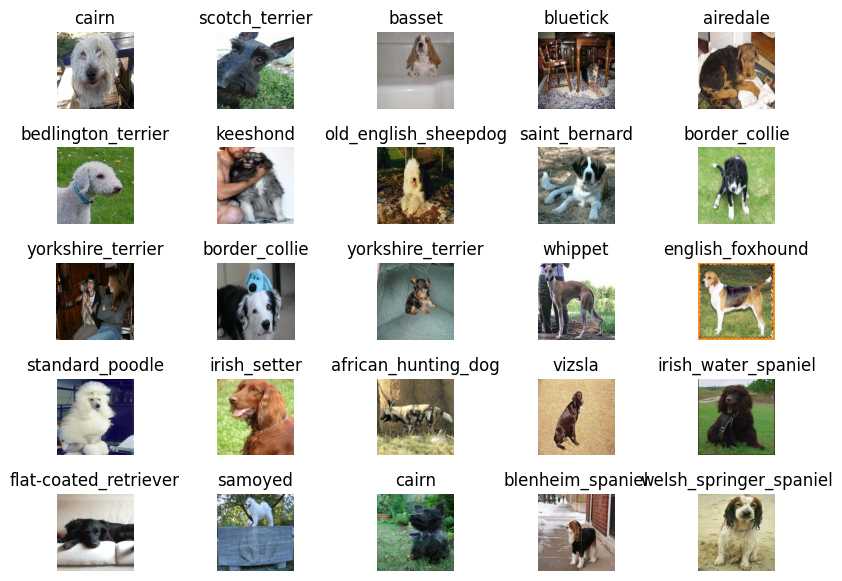

In [ ]:
show_25_images(val_images, val_labels)

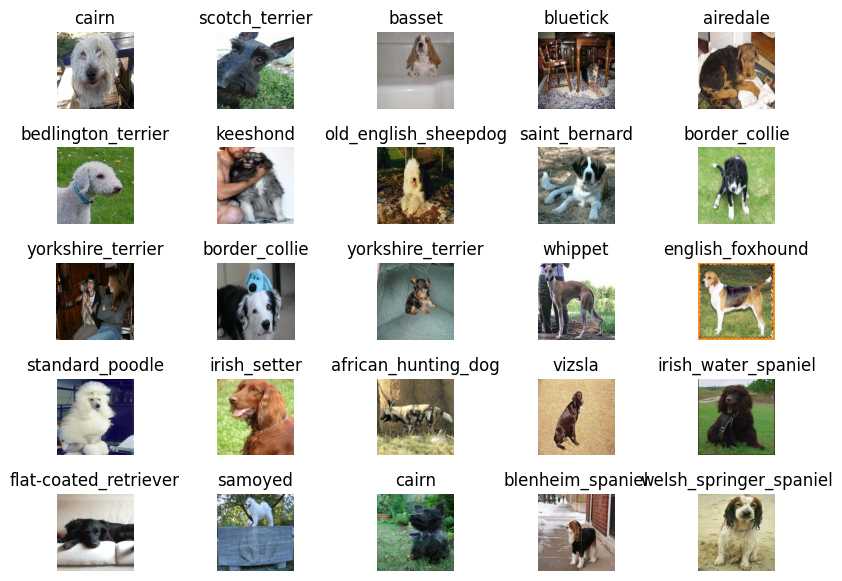

In [ ]:
show_25_images(val_images, val_labels)

###Building a model

In [ ]:
# setup input shape for the model
INPUT_SHAPE = [None, IMAGE_SIZE, IMAGE_SIZE, 3]
# setup output shape for the model
OUTPUT_SHAPE = len(num_unique_elements)
#setup model url from Tensorflow hub
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"

In [ ]:
#now we have inputs, outputs and mdel lets put them together into a keras deep learning model



def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)
  # setup model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), #layer 1 : input layer
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax") #layer 2 : output layer
  ])
  # compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  #Build model
  model.build(INPUT_SHAPE)
  return model





In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

###creating callbacks

In [ ]:
#tensor boarad callback
%load_ext tensorboard




In [ ]:
import datetime
#create a function to build a tensornoard callback
def create_tensorboard_callback():
  #create a log directory for storing tensorboard logs
  logdir = os.path.join("Dog Vision/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  #create a tensorboard callback
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir)
  print(f"Saving TensorBoard log files to: {logdir}")
  return tensorboard_callback


In [ ]:
# create an early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", patience=3)




###Training out model


In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100}


In [ ]:
# create function which will be train a model on 1000 images to make sure everything is working

def train_model():
  #create a model
  model = create_model()
  #create a tensorboard callback
  tensorboard = create_tensorboard_callback()
  #fit the model to the data passing it
  model.fit(
      x=train_data,
      epochs=NUM_EPOCHS,
      validation_data=valid_data,
      validation_freq=1,
      callbacks=[tensorboard, early_stopping]
  )
  return model

In [ ]:
#fit the model to the data
model = train_model()


Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Saving TensorBoard log files to: Dog Vision/logs/20240626-141401
Epoch 1/100
25/25 [==============================] - 10s 119ms/step - loss: 4.5081 - accuracy: 0.1063 - val_loss: 3.3048 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 2s 76ms/step - loss: 1.5929 - accuracy: 0.6888 - val_loss: 2.1290 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 2s 93ms/step - loss: 0.5591 - accuracy: 0.9337 - val_loss: 1.7025 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 2s 99ms/step - loss: 0.2540 - accuracy: 0.9862 - val_loss: 1.4992 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 2s 78ms/step - loss: 0.1472 - accuracy: 0.9950 - val_loss: 1.4216 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 2s 77ms/step - loss: 0.1011 - accuracy: 1.0000 - val_loss: 1.3828 

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
!pkill -f "tensorboard""

/bin/bash: -c: line 1: unexpected EOF while looking for matching `"'
/bin/bash: -c: line 2: syntax error: unexpected end of file


In [ ]:
# checking the tensorboard logs
%tensorboard --logdir /content/Dog\ Vision/logs


<IPython.core.display.Javascript object>

###Making predictions using a trained model

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# make predictions on the validation data
predictions = model.predict(valid_data, verbose=1)
predictions

7/7 [==============================] - 1s 60ms/step


array([[2.3897267e-03, 3.6411169e-05, 4.5147160e-04, ..., 3.6317954e-04,
        1.5888623e-05, 2.1348810e-03],
       [4.5158812e-03, 9.8145090e-04, 2.3481952e-02, ..., 1.4192016e-03,
        1.9490373e-03, 3.0654884e-04],
       [1.4543391e-04, 9.0110654e-05, 1.2999219e-04, ..., 9.9557699e-05,
        1.7646392e-04, 3.0857921e-04],
       ...,
       [4.5787674e-05, 1.8383746e-05, 2.3688737e-04, ..., 3.0384401e-05,
        4.6432496e-04, 4.6602850e-05],
       [1.1297790e-02, 1.8945588e-04, 7.1580856e-05, ..., 1.3128821e-04,
        1.0071172e-04, 1.0855254e-02],
       [1.6886060e-03, 2.3222439e-05, 4.0988517e-03, ..., 1.0120501e-02,
        5.0448236e-04, 1.9836804e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([2.3897267e-03, 3.6411169e-05, 4.5147160e-04, 1.7302168e-04,
       4.5752453e-04, 1.3909912e-04, 2.3896664e-02, 1.0364548e-03,
       1.4660624e-04, 1.8280432e-04, 7.3905700e-05, 2.8413016e-04,
       8.5676285e-05, 8.1622013e-05, 2.2460306e-03, 1.9787559e-04,
       2.7036869e-05, 4.4507197e-01, 6.0292012e-05, 4.2009600e-05,
       8.9315319e-04, 4.3160381e-04, 9.8397168e-06, 1.5706460e-03,
       1.3822752e-04, 3.5885375e-04, 1.6610748e-01, 4.6626858e-05,
       1.3357832e-04, 7.6607603e-04, 1.4559261e-04, 7.1742450e-04,
       3.0047583e-04, 6.2670937e-05, 8.4098363e-05, 1.1687127e-02,
       2.6139538e-05, 1.0519160e-03, 9.8993100e-05, 1.3653585e-04,
       2.0414293e-03, 2.4251045e-05, 1.9524276e-04, 2.1968287e-04,
       2.7370159e-05, 1.7717961e-05, 1.2987391e-04, 3.6588768e-04,
       3.6387410e-04, 2.6174687e-04, 6.6639739e-05, 9.5536561e-06,
       9.5481472e-04, 2.8938649e-04, 5.2613159e-05, 4.8211947e-05,
       2.7097491e-04, 1.9037559e-03, 4.3269532e-04, 1.0964255e

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[0])}")
print(f"Max index: {np.argmax(predictions[0])}")
print(f"Predicted label: {num_unique_elements[np.argmax(predictions[0])]}")

[2.3897267e-03 3.6411169e-05 4.5147160e-04 1.7302168e-04 4.5752453e-04
 1.3909912e-04 2.3896664e-02 1.0364548e-03 1.4660624e-04 1.8280432e-04
 7.3905700e-05 2.8413016e-04 8.5676285e-05 8.1622013e-05 2.2460306e-03
 1.9787559e-04 2.7036869e-05 4.4507197e-01 6.0292012e-05 4.2009600e-05
 8.9315319e-04 4.3160381e-04 9.8397168e-06 1.5706460e-03 1.3822752e-04
 3.5885375e-04 1.6610748e-01 4.6626858e-05 1.3357832e-04 7.6607603e-04
 1.4559261e-04 7.1742450e-04 3.0047583e-04 6.2670937e-05 8.4098363e-05
 1.1687127e-02 2.6139538e-05 1.0519160e-03 9.8993100e-05 1.3653585e-04
 2.0414293e-03 2.4251045e-05 1.9524276e-04 2.1968287e-04 2.7370159e-05
 1.7717961e-05 1.2987391e-04 3.6588768e-04 3.6387410e-04 2.6174687e-04
 6.6639739e-05 9.5536561e-06 9.5481472e-04 2.8938649e-04 5.2613159e-05
 4.8211947e-05 2.7097491e-04 1.9037559e-03 4.3269532e-04 1.0964255e-01
 7.2684762e-04 7.5271746e-06 8.8053587e-04 3.7352533e-05 2.6141159e-04
 7.6868022e-03 4.5350080e-04 1.4537548e-04 7.7538872e-03 7.8203346e-05
 2.992

In [ ]:
# turn predicition probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return num_unique_elements[np.argmax(prediction_probabilities)]


In [ ]:
# get a predicted label
get_pred_label(predictions[0])

'border_terrier'

In [ ]:
get_pred_label(predictions[9])

'collie'

In [ ]:
get_pred_label(predictions[81])

'chihuahua'

In [ ]:
# our validation data is stil in a batch so we have to unbatch it and then compare those predicitions
images_ = []
labels_ =[]
# loop through unbatched data
for image, label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

In [ ]:
# create a function our validation data is stil in a batch so we have to unbatch it and then compare those predicitions
def unbatchify(data):

  images = []
  labels =[]
  # loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(num_unique_elements[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(valid_data)



In [ ]:
val_images, val_labels

([array([[[0.29599646, 0.43284872, 0.3056691 ],
          [0.26635826, 0.32996926, 0.22846507],
          [0.31428418, 0.27701408, 0.22934894],
          ...,
          [0.77614343, 0.82320225, 0.8101595 ],
          [0.81291157, 0.8285351 , 0.8406944 ],
          [0.8209297 , 0.8263737 , 0.8423668 ]],
  
         [[0.2344871 , 0.31603682, 0.19543913],
          [0.3414841 , 0.36560842, 0.27241898],
          [0.45016077, 0.40117094, 0.33964607],
          ...,
          [0.7663987 , 0.8134138 , 0.81350833],
          [0.7304248 , 0.75012016, 0.76590735],
          [0.74518913, 0.76002574, 0.7830809 ]],
  
         [[0.30157745, 0.3082587 , 0.21018331],
          [0.2905954 , 0.27066195, 0.18401104],
          [0.4138316 , 0.36170745, 0.2964005 ],
          ...,
          [0.79871625, 0.8418535 , 0.8606443 ],
          [0.7957738 , 0.82859945, 0.8605655 ],
          [0.75181633, 0.77904975, 0.8155256 ]],
  
         ...,
  
         [[0.9746779 , 0.9878955 , 0.9342279 ],
          [0.9

In [ ]:
get_pred_label(val_labels[0])

'affenpinscher'

### Visualizing model predictions

In [ ]:
def plot_pred(prediction_probabilities,labels,imges,n=1):
  pred_prob , true_label, image = prediction_probabilities[n], labels[n], imges[n]
  # get pred label
  pred_label = get_pred_label(pred_prob)
  # create figure and subplots
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  #change the color
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  plt.title("{}{:2.0f}%{}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)
  plt.show()

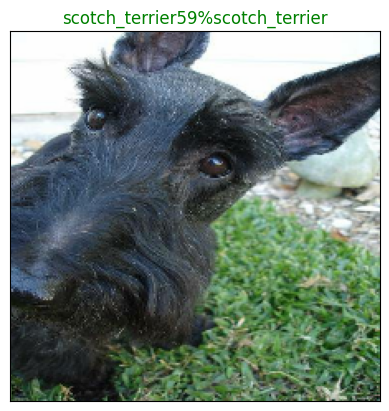

In [ ]:
plot_pred(predictions,val_labels,val_images)

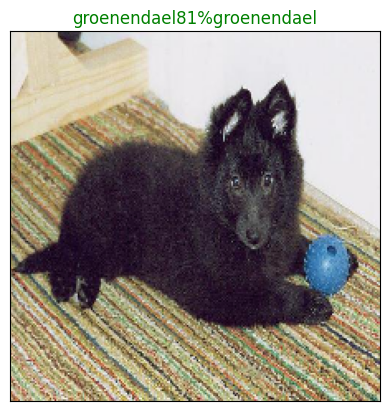

In [ ]:
plot_pred(predictions,val_labels,val_images,n=77)

In [ ]:
# create a function to view our models top 10 predicitons
def plot_pred_conf(prediction_probabilities,labels,n=1): # Added images as a parameter
  prediction_prob,true_label = prediction_probabilities[n],labels[n]
  #get pred label
  pred_label = get_pred_label(prediction_prob)
  #find top 10 predictions
  top_10_pred_idx = prediction_prob.argsort()[-10:][::-1]
  # find top 10 prediction confidence values
  top_10_pred_conf = prediction_prob[top_10_pred_idx]
  #find the top 10 prediction labels
  top_10_pred_labels = num_unique_elements[top_10_pred_idx] # Assuming num_unique_elements is defined elsewhere
  #create figure
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_conf,color = "grey") # Fixed typo: arrange -> arange
  plt.xticks(np.arange(len(top_10_pred_labels)),top_10_pred_labels,rotation = "vertical")
  # change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.where(top_10_pred_labels == true_label)[0][0]].set_color("green")
  else:
   pass

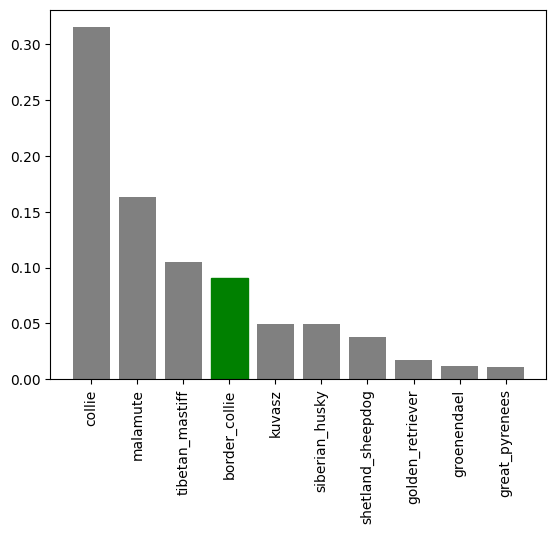

In [ ]:
plot_pred_conf(predictions,val_labels,n=9)

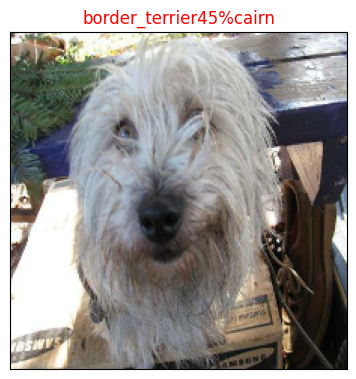

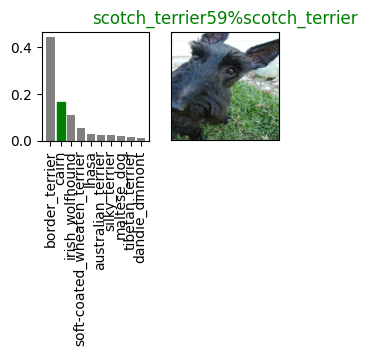

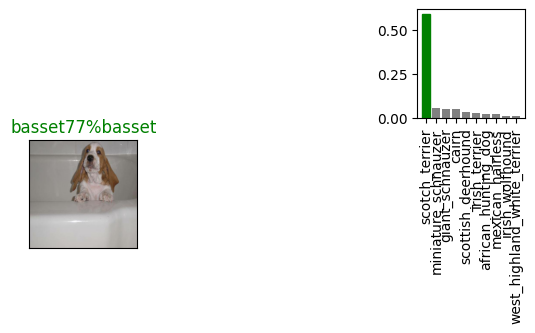

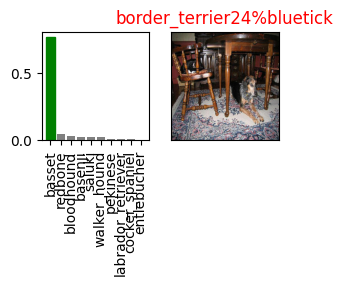

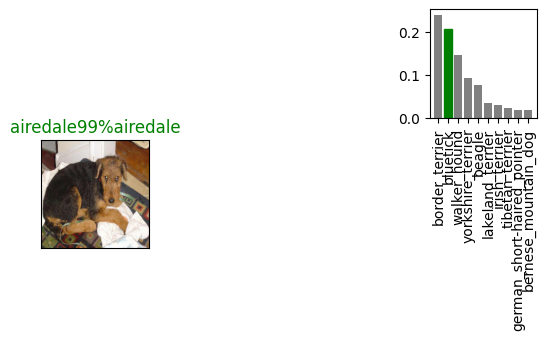

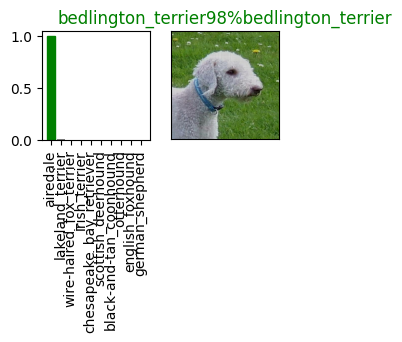

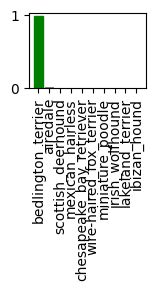

In [ ]:
# lets checkout a few predictions and their different values
i_multiplier =0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions,val_labels,val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions,val_labels,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

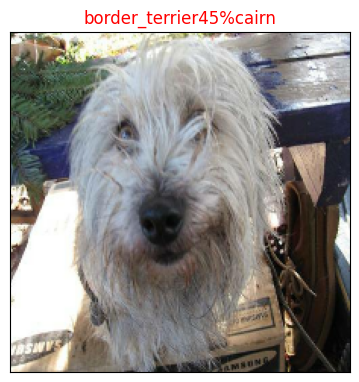

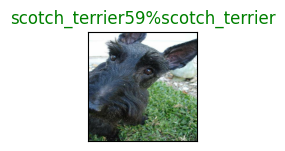

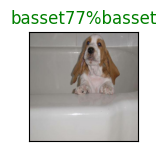

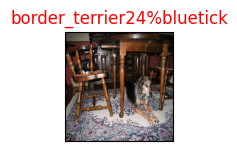

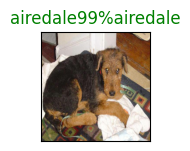

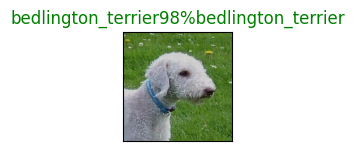

<Figure size 640x480 with 0 Axes>

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize=(5 * num_cols, 5 * num_rows))  # Adjust figure size for equal spacing

for i in range(num_images):
  plt.subplot(num_rows, num_cols, i + 1)  # Use num_cols instead of 2*num_cols
  plot_pred(predictions, val_labels, val_images, n=i + i_multiplier)
  plt.tight_layout()  # Add tight_layout to adjust spacing
plt.show()  # Display the plot

###save model


In [ ]:
def save_model(model, suffix=None):
  # Create a model directory with current time
  modeldir = os.path.join("Dog Vision/models", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# function to load a model
def load_model(model_path):
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: Dog Vision/models/20240626-142738-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'Dog Vision/models/20240626-142738-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_image_model = load_model("/content/Dog Vision/models/20240626-142738-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: /content/Dog Vision/models/20240626-142738-1000-images-mobilenetv2-Adam.h5


In [ ]:

from google.colab import files

# Get the model file path
model_path = "/content/Dog Vision/models/20240626-142738-1000-images-mobilenetv2-Adam.h5"

# Download the file
files.download(model_path)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
model.evaluate(valid_data)

7/7 [==============================] - 1s 92ms/step - loss: 1.2468 - accuracy: 0.6800


[1.2468341588974, 0.6800000071525574]

In [ ]:
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 2s 73ms/step - loss: 1.2468 - accuracy: 0.6800


[1.2468341588974, 0.6800000071525574]

### Training model on full dataset

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
len(train_filenames),len(val_filenames)

(800, 200)

In [ ]:
# create a data batch with the full data set
full_data = create_data_batches(X, y)


Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# create model for full model
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy", patience=3)

Saving TensorBoard log files to: Dog Vision/logs/20240626-145118


In [ ]:
# fit the full model to the full data
full_model.fit(
    x=full_data,
    epochs=NUM_EPOCHS,
    callbacks=[full_model_tensorboard, full_model_early_stopping]
    )

Epoch 1/100
320/320 [==============================] - 18s 55ms/step - loss: 0.0075 - accuracy: 0.9989
Epoch 2/100
320/320 [==============================] - 20s 63ms/step - loss: 0.0071 - accuracy: 0.9990
Epoch 3/100
320/320 [==============================] - 18s 57ms/step - loss: 0.0079 - accuracy: 0.9989
Epoch 4/100
320/320 [==============================] - 18s 55ms/step - loss: 0.0049 - accuracy: 0.9992
Epoch 5/100
320/320 [==============================] - 18s 56ms/step - loss: 0.0067 - accuracy: 0.9992
Epoch 6/100
320/320 [==============================] - 20s 62ms/step - loss: 0.0086 - accuracy: 0.9987
Epoch 7/100
320/320 [==============================] - 18s 55ms/step - loss: 0.0073 - accuracy: 0.9989


In [ ]:
save_model(full_model, suffix="full-dataset-mobilenetv2-Adam")

Saving model to: Dog Vision/models/20240626-145502-full-dataset-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'Dog Vision/models/20240626-145502-full-dataset-mobilenetv2-Adam.h5'

### making predictions on test dataset

In [ ]:
#load test image filenames
test_path = "Dog Vision/test"
test_filenames = [test_path + "/" + filename for filename in os.listdir(test_path)]
test_filenames


['Dog Vision/test/bfabbffb6f9f517741b4317bd6d9ef99.jpg',
 'Dog Vision/test/03bb0c67dce7792133b3ca579992d370.jpg',
 'Dog Vision/test/00496f65de6cc319145ce97bd6e90360.jpg',
 'Dog Vision/test/f11821f2a5777c36a4081588fb96798f.jpg',
 'Dog Vision/test/c61e044e555a82ffc061d3e8cffbef41.jpg',
 'Dog Vision/test/670a3370bb1ae920b7645508f969bc31.jpg',
 'Dog Vision/test/aebe384a26c75dc6bf33d64bb008539a.jpg',
 'Dog Vision/test/1ffabb38e9a3bd353888d49399517c31.jpg',
 'Dog Vision/test/e1e6d180a31b0a9c0d741d0f142ea6af.jpg',
 'Dog Vision/test/3706f3983a0e8ad6772d343796ec8c06.jpg',
 'Dog Vision/test/4899470bff9474bf464d77a795016109.jpg',
 'Dog Vision/test/fc584aa0af57439b8bd9568ab52f9030.jpg',
 'Dog Vision/test/ed306448d7f19d3e5cfd7b446898cd44.jpg',
 'Dog Vision/test/434c8a93477c1aafde30ba5dda9076c4.jpg',
 'Dog Vision/test/62cb6f10735860b02cfbe6d6ba8a2d55.jpg',
 'Dog Vision/test/4b3d298ff13032c4360b699f7ba83ab7.jpg',
 'Dog Vision/test/2c6213b60240d0a676b6a6ecca5c62ce.jpg',
 'Dog Vision/test/982818afa4c75

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_filenames)
test_data

Creating training data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [ ]:
#make predictions on test data batchusing the  full model
test_predictions = full_model.predict(test_data, verbose=1)
test_predictions

324/324 [==============================] - 24s 71ms/step


array([[2.8222650e-11, 1.3950901e-08, 7.9350207e-12, ..., 1.0968688e-08,
        8.4235042e-01, 5.9502817e-08],
       [5.2869993e-17, 9.8524799e-14, 4.2909486e-15, ..., 5.1836324e-13,
        9.4368836e-12, 8.0209522e-15],
       [9.9993849e-01, 2.3980336e-14, 6.2818266e-16, ..., 2.3456208e-15,
        2.4287169e-11, 6.8468470e-10],
       ...,
       [9.8803410e-11, 4.3975530e-09, 2.3043420e-12, ..., 1.8014299e-09,
        4.3048505e-05, 1.4776549e-10],
       [8.2876711e-15, 5.0025430e-13, 1.1576897e-13, ..., 3.1626378e-13,
        5.2908361e-10, 2.6839460e-14],
       [1.5807488e-17, 3.5282581e-14, 3.5257421e-14, ..., 6.1659919e-14,
        8.8786163e-15, 4.1135071e-20]], dtype=float32)

In [ ]:
np.savetxt("Dog Vision/test_predictions.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

### Making predictions on our images


In [ ]:
custom_path = "Dog Vision/my-dog-photos"
custom_image_paths = [custom_path + "/" + filename for filename in os.listdir(custom_path)]
custom_image_paths

['Dog Vision/my-dog-photos/small-dog-owners-1.jpg',
 'Dog Vision/my-dog-photos/images.jpg',
 'Dog Vision/my-dog-photos/images (1).jpg']

In [ ]:
custom_data = create_data_batches(custom_image_paths, test_data= True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# make predictions
custom_predictions = full_model.predict(custom_data, verbose=1)
custom_predictions

1/1 [==============================] - 28s 28s/step


array([[5.38037497e-12, 1.18319410e-17, 2.57939082e-16, 1.44302108e-16,
        4.22156240e-14, 6.34583955e-15, 5.11538858e-12, 5.68549999e-11,
        9.57252792e-16, 6.81973712e-15, 1.65760228e-13, 1.91388721e-14,
        4.04567737e-13, 4.01166595e-14, 3.79310459e-16, 1.36122569e-12,
        7.23631298e-17, 9.17779362e-16, 2.63614967e-17, 1.04293969e-16,
        3.14782431e-15, 5.96620518e-13, 1.35056188e-10, 4.54094681e-16,
        5.65723954e-13, 2.43504273e-13, 5.79980671e-14, 5.37463812e-17,
        3.06636409e-16, 1.37312254e-11, 1.59593158e-10, 1.30726091e-13,
        2.18063604e-13, 1.84243735e-16, 3.43965998e-15, 4.45913041e-14,
        5.13205781e-17, 7.41247511e-15, 1.03297759e-16, 1.07724905e-13,
        1.58350455e-19, 2.47246899e-17, 1.56119475e-16, 6.20959986e-17,
        7.78176199e-15, 7.93641208e-14, 2.29229201e-18, 2.38880067e-21,
        9.88470699e-19, 3.16825421e-16, 4.81310853e-14, 6.02110062e-17,
        3.44174707e-15, 1.38143810e-13, 1.97577966e-16, 6.523491

In [ ]:
# get cutsom image preiction label
custom_pred_labels = [get_pred_label(custom_predictions[i]) for i in range(len(custom_predictions))]
custom_pred_labels

['yorkshire_terrier', 'german_shepherd', 'collie']

In [ ]:
custom_images = []
# loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


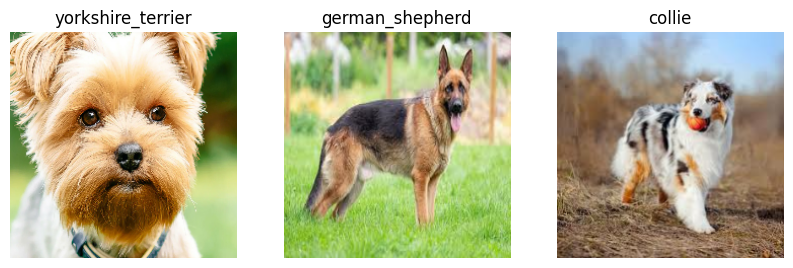

In [ ]:
# plot custom image predicitions
plt.figure(figsize=(10, 10))
for i in range(len(custom_images)):
  plt.subplot(3, 3, i + 1)
  plt.imshow(custom_images[i])
  plt.title(custom_pred_labels[i])
  plt.axis("off")